# Internet Firewall

## Principal Component Analysis (PCA) 

In [400]:
# IMPORT DEPENDENCIES 
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import sklearn
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from matplotlib.colors import ListedColormap
import mpl_toolkits.mplot3d 
import plotly.express as px
import plotly.graph_objects as go
import plotly as plty
from plotly.offline import plot
from psynlig import pca_1d_loadings

### Load Data

In [401]:
# READ DATA 
internet_firewall = pd.read_csv("C:/Users/kayan/UCD/STA221/Final_Project/Data/log2.csv") 
#internet_firewall[internet_firewall.isnull().any(axis=1)]
internet_firewall

,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Action,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,pkts_received
0,57222,53,54587,53,allow,177,94,83,2,30,1,1
1,56258,3389,56258,3389,allow,4768,1600,3168,19,17,10,9
2,6881,50321,43265,50321,allow,238,118,120,2,1199,1,1
3,50553,3389,50553,3389,allow,3327,1438,1889,15,17,8,7
4,50002,443,45848,443,allow,25358,6778,18580,31,16,13,18
...,...,...,...,...,...,...,...,...,...,...,...,...
65527,63691,80,13237,80,allow,314,192,122,6,15,4,2
65528,50964,80,13485,80,allow,4680740,67312,4613428,4675,77,985,3690
65529,54871,445,0,0,drop,70,70,0,1,0,1,0
65530,54870,445,0,0,drop,70,70,0,1,0,1,0


In [402]:
feature_names = ['Source Port', 'Destination Port', 'NAT Source Port', 
                'Bytes', 'Bytes Sent', 'Bytes Received', 'Packets', 
                'Elapsed Time (sec)', 'pkts_sent', 'pkts_received'] #list of features 

In [403]:
# SUMMARIZE DATA
internet_firewall.describe()

,Source Port,Destination Port,NAT Source Port,NAT Destination Port,Bytes,Bytes Sent,Bytes Received,Packets,Elapsed Time (sec),pkts_sent,pkts_received
count,65532.000000,65532.000000,65532.000000,65532.000000,6.553200e+04,6.553200e+04,6.553200e+04,6.553200e+04,65532.000000,65532.000000,65532.000000
mean,49391.969343,10577.385812,19282.972761,2671.049930,9.712395e+04,2.238580e+04,7.473815e+04,1.028660e+02,65.833577,41.399530,61.466505
std,15255.712537,18466.027039,21970.689669,9739.162278,5.618439e+06,3.828139e+06,2.463208e+06,5.133002e+03,302.461762,3218.871288,2223.332271
min,0.000000,0.000000,0.000000,0.000000,6.000000e+01,6.000000e+01,0.000000e+00,1.000000e+00,0.000000,1.000000,0.000000
25%,49183.000000,80.000000,0.000000,0.000000,6.600000e+01,6.600000e+01,0.000000e+00,1.000000e+00,0.000000,1.000000,0.000000
50%,53776.500000,445.000000,8820.500000,53.000000,1.680000e+02,9.000000e+01,7.900000e+01,2.000000e+00,15.000000,1.000000,1.000000
75%,58638.000000,15000.000000,38366.250000,443.000000,7.522500e+02,2.100000e+02,4.490000e+02,6.000000e+00,30.000000,3.000000,2.000000
max,65534.000000,65535.000000,65535.000000,65535.000000,1.269359e+09,9.484772e+08,3.208818e+08,1.036116e+06,10824.000000,747520.000000,327208.000000


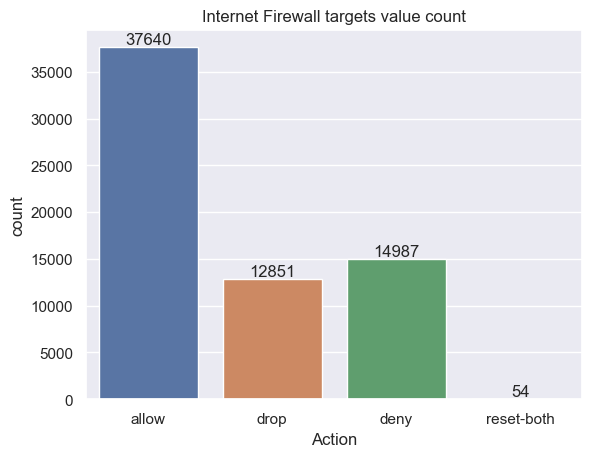

In [404]:
# DIST OF TARGET CATEGORIES 

ax = sns.countplot(x='Action', data=internet_firewall)
for container in ax.containers:
    ax.bar_label(container)
plt.title('Internet Firewall targets value count')
plt.show()

In [405]:
# SPLIT DATA INTO TEST AND TRAIN SETS 
features = ['Destination Port', 'NAT Source Port', 'Elapsed Time (sec)', 'pkts_received'] #top 4
X = internet_firewall[features]
y = internet_firewall[['Action']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [406]:
y_train.reset_index(drop=True, inplace=True)

### Preprocess Data

In [407]:
# STANDARD SCALAR NORMALIZATION OF FEATURES 
sc = MinMaxScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [408]:
# SUMMARIZE SCALED DATA
df = pd.DataFrame(X_train_sc)
df.describe()

,0,1,2,3
count,52425.000000,52425.000000,52425.000000,52425.000000
mean,0.161101,0.293767,0.006721,0.000206
std,0.281530,0.334921,0.030865,0.007550
min,0.000000,0.000000,0.000000,0.000000
25%,0.001221,0.000000,0.000000,0.000000
50%,0.006790,0.133684,0.001523,0.000003
75%,0.224537,0.584237,0.003045,0.000006
max,1.000000,1.000000,1.000000,1.000000


### Optimal number of components

Text(0, 0.5, 'cumulative explained variance')

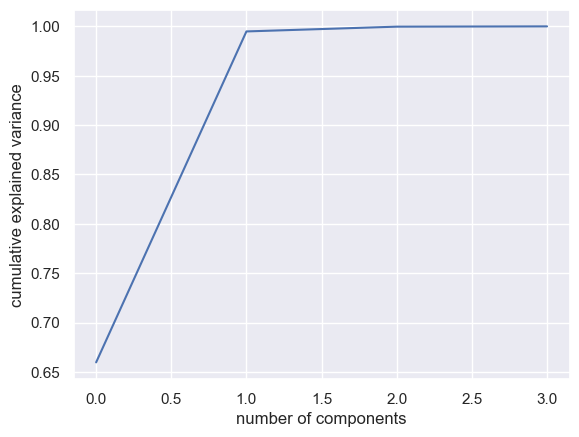

In [409]:
# CUMULATIVE EXPLAINED VARIANCE PLOT 
pca = PCA().fit(X_train_sc)
#plt.plot(pca.explained_variance_ratio_)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')

In [410]:
# CUMULATIVE EXPLAINED VARIANCE PLOT INTERACTIVE 
pca = PCA()
pca.fit(X_train_sc)
exp_var_cumul = np.cumsum(pca.explained_variance_ratio_)

px.area(
    x=range(1, exp_var_cumul.shape[0] + 1),
    y=exp_var_cumul,
    labels={"x": "Number of Components", "y": "Explained Variance"}
)

### 1 Component

In [411]:
# PERFORM PCA (UNSUPERVISED) WITH 1 COMPONENT 
pca = PCA(n_components = 1) #project data  into 1 dimensions
X_train_pc = pca.fit_transform(X_train_sc) #components 
X_test_pc = pca.transform(X_test_sc)

In [412]:
print('Shape before PCA: ', X_train_sc.shape)
print('Shape after PCA: ', X_train_pc.shape)

Shape before PCA:  (52425, 4)
Shape after PCA:  (52425, 1)


In [413]:
# EXPLAINED VARIANCE RATIO
explained_var = pca.explained_variance_ratio_
explained_var

array([0.65966137])

### 2 Components 

In [414]:
# PERFORM PCA (UNSUPERVISED) WITH 2 COMPONENTS 
pca = PCA(n_components = 2) #project data  into two dimensions
X_train_pc = pca.fit_transform(X_train_sc)
X_test_pc = pca.transform(X_test_sc)

In [415]:
print('Shape before PCA: ', X_train_sc.shape)
print('Shape after PCA: ', X_train_pc.shape)

Shape before PCA:  (52425, 4)
Shape after PCA:  (52425, 2)


In [416]:
# EXPLAINED VARIANCE RATIO
explained_var = pca.explained_variance_ratio_
explained_var

array([0.65966137, 0.33521252])

[0.12694601 0.06450869]


Text(0, 0.5, 'Proportion of Variance Explained')

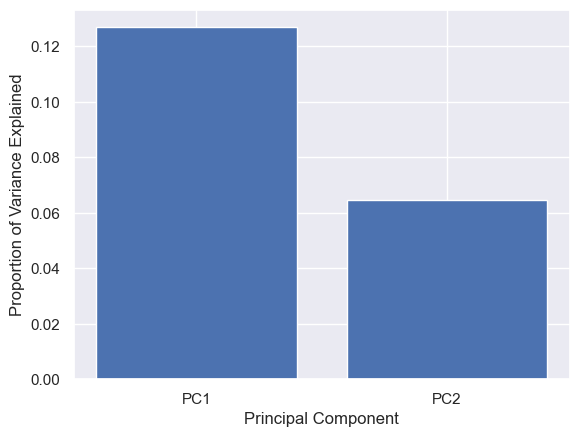

In [417]:
# EXPLAINED VARIANCE
var = pca.explained_variance_
print(var)
labels = ['PC1','PC2']
plt.figure()
plt.bar(labels, var)
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')

In [418]:
# COMBINE TARGET AND COMPONENTS 
df1 = pd.DataFrame(data = X_train_pc, columns = ['PC1', 'PC2'])
df2 = pd.concat([df1,y_train], axis = 1)
df2

,PC1,PC2,Action
0,0.002003,-0.182326,allow
1,-0.654276,0.571714,deny
2,0.116027,-0.112023,allow
3,0.148517,-0.100844,allow
4,-0.467774,0.236452,deny
...,...,...,...
52420,0.502162,0.257860,allow
52421,-0.181756,-0.277703,drop
52422,0.451526,0.616105,allow
52423,-0.444705,0.194982,deny


In [420]:
# PLOT COMPONENTS 
total_var = pca.explained_variance_ratio_.sum() * 100
fig = px.scatter(df2, x='PC1', y='PC2',  color='Action',opacity=0.5)
fig.update_layout( title={
        'text': f'Total Explained Variance: {total_var:.2f}%',
        'y':1,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})   
fig.show()

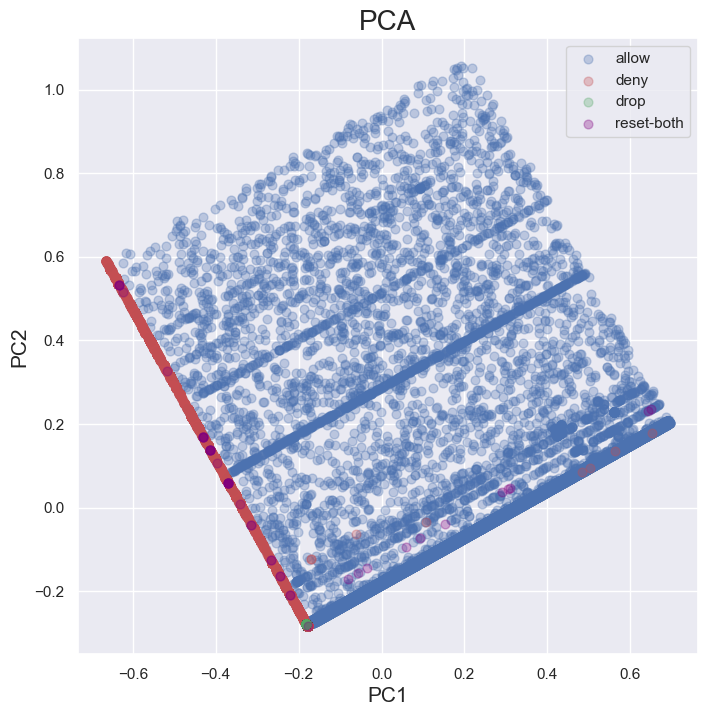

In [421]:
# DIFFERENT VERSION OF PLOT ABOVE 
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('PC1', fontsize = 15)
ax.set_ylabel('PC2', fontsize = 15)
ax.set_title('PCA', fontsize = 20)

targets = ['allow', 'deny', 'drop', 'reset-both']
colors = ['b', 'r', 'g', 'purple']
for target, color in zip(targets,colors):
    indicesToKeep = df2['Action'] == target
    ax.scatter(df2.loc[indicesToKeep, 'PC1']
               , df2.loc[indicesToKeep, 'PC2']
               , c = color
               , s = 40, alpha = 0.3)
ax.legend(targets)

In [422]:
print('Number of features seen during fit: ', pca.n_features_in_)
print('Estimated noise covariance: ', pca.noise_variance_) 

Number of features seen during fit:  4
Estimated noise covariance:  0.0004932372438845312


In [423]:
# PCA LOADINGS
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=targets)
loadings

,PC1,PC2
allow,-0.486117,0.873859
deny,0.873845,0.485977
drop,0.009222,0.014000
reset-both,0.000406,0.000056


In [424]:
# RESCALE PC
pca_df_scaled = df2.copy()
scaler_df = df2[['PC1', 'PC2']]
scaler = 1 / (scaler_df.max() - scaler_df.min())
for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]
pca_df_scaled

,PC1,PC2,Action
0,0.001473,-0.136095,allow
1,-0.481309,0.426751,deny
2,0.085354,-0.083618,allow
3,0.109255,-0.075274,allow
4,-0.344111,0.176497,deny
...,...,...,...
52420,0.369409,0.192477,allow
52421,-0.133706,-0.207289,drop
52422,0.332159,0.459886,allow
52423,-0.327141,0.145542,deny


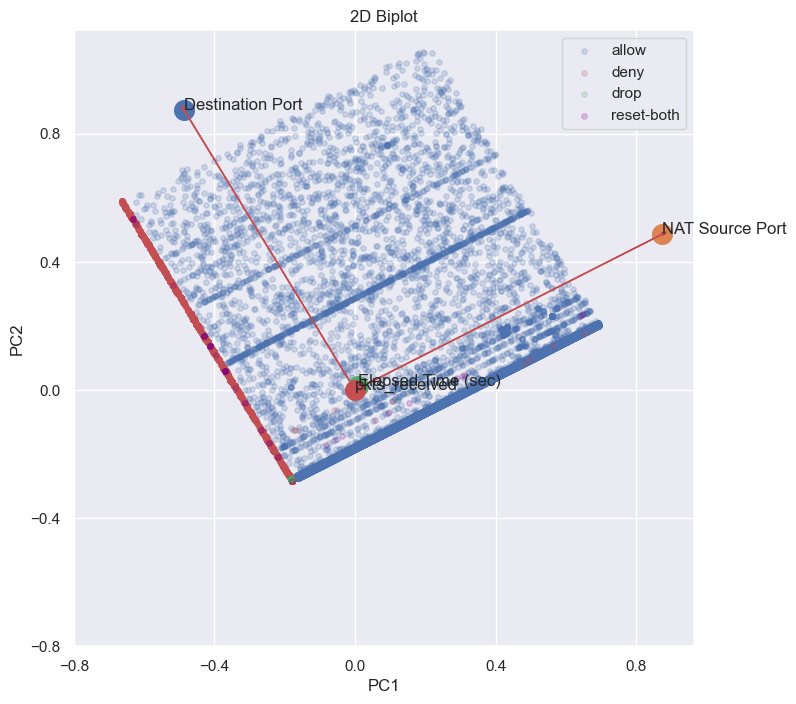

In [425]:
# 2D BIPLOT
xs = loadings['PC1']
ys = loadings['PC2']

#sns.scatterplot(x="PC1", y="PC2",data=pca_df_scaled, color = '', alpha=0.5)
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 


targets = ['allow', 'deny', 'drop', 'reset-both']
colors = ['b', 'r', 'g', 'purple']
for target, color in zip(targets,colors):
    indicesToKeep = df2['Action'] == target
    ax.scatter(df2.loc[indicesToKeep, 'PC1']
               , df2.loc[indicesToKeep, 'PC2']
               , c = color
               , s = 15, alpha = 0.2)
ax.legend(targets)

for i, varnames in enumerate(features):
    plt.scatter(xs[i], ys[i], s=200)
    plt.arrow(
        0, 0, # coordinates of arrow base
        xs[i], # length of the arrow along x
        ys[i], # length of the arrow along y
        color='r', 
        head_width=0.01
        )
    plt.text(xs[i], ys[i], varnames)

xticks = np.linspace(-0.8, 0.8, num=5)
yticks = np.linspace(-0.8, 0.8, num=5)
plt.xticks(xticks)
plt.yticks(yticks)
plt.xlabel('PC1')
plt.ylabel('PC2')
 
# Show plot
plt.title('2D Biplot')
plt.show()

In [427]:
#
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter(X_train_pc, x=0, y=1, color=df2['Action'],opacity=0.25)

for i, feature in enumerate(features):
    fig.add_annotation(
        ax=0, ay=0,
        axref="x", ayref="y",
        x=loadings[i, 0],
        y=loadings[i, 1],
        showarrow=True,
        arrowsize=2,
        arrowhead=2,
        xanchor="right",
        yanchor="top"
    )
    fig.add_annotation(
        x=loadings[i, 0],
        y=loadings[i, 1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        yshift=5,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="black"
            ), 
        bordercolor="#c7c7c7",
        borderwidth=2,
        borderpad=4,
        bgcolor="#ff7f0e",
        opacity=0.7
    )
fig.update_layout(title={
        'text': f'Total Explained Variance: {total_var:.2f}%',
        'y':1,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

#### Prediction

Use Random Forest Classification to make predictions: 

In [428]:
# PREDICTION: RF
y_train.reset_index(drop=True, inplace=True)
classifier = RandomForestClassifier(max_depth=3, random_state=0)
classifier.fit(X_train_pc, np.squeeze(y_train))
y_pred = classifier.predict(X_test_pc) #predict 

In [429]:
# EVALUATE PERFORMANCE 
cm = confusion_matrix(y_test, y_pred)
print(cm)
acc21 = accuracy_score(y_test, y_pred)
print('Accuracy: ', acc21)

[[7250  272    0    0]
 [  22 2961    6    0]
 [   0    0 2589    0]
 [   1    6    0    0]]
Accuracy:  0.976577401388571


In [430]:
# F1-SCORE 
f2a =  f1_score(y_test, y_pred,average='micro') 
f2b = f1_score(y_test, y_pred,average='macro')
f2c = f1_score(y_test, y_pred,average='weighted')
print('F1-score: ',f2a)
print('F1-score: ', f2b)
print('F1-score: ', f2c)

F1-score:  0.976577401388571
F1-score:  0.7324426189944151
F1-score:  0.9765898118733422


In [431]:
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

       allow       1.00      0.96      0.98      7522
        deny       0.91      0.99      0.95      2989
        drop       1.00      1.00      1.00      2589
  reset-both       0.00      0.00      0.00         7

    accuracy                           0.98     13107
   macro avg       0.73      0.74      0.73     13107
weighted avg       0.98      0.98      0.98     13107



Use Logistic Regression to make predictions: 

In [432]:
# PREDICTION: LR
classifier = LogisticRegression(random_state = 0,max_iter=1000)
classifier.fit(X_train_pc, y_train.values.ravel())
y_pred = classifier.predict(X_test_pc) #predict 

In [433]:
# EVALUATE PERFORMANCE 
cm = confusion_matrix(y_test, y_pred)
print(cm)
acc22 =  accuracy_score(y_test, y_pred)
print('Accuracy: ',acc22)

[[7206   93  223    0]
 [   4 2772  213    0]
 [   0    0 2589    0]
 [   1    6    0    0]]
Accuracy:  0.9588006408789197


In [434]:
# F1-SCORES
f2d =  f1_score(y_test, y_pred,average='micro') 
f2e = f1_score(y_test, y_pred,average='macro')
f2f = f1_score(y_test, y_pred,average='weighted')
print('F1-score: ',f2d)
print('F1-score: ', f2e)
print('F1-score: ', f2f)

F1-score:  0.9588006408789197
F1-score:  0.7116560691691634
F1-score:  0.9593240981409905


In [435]:
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

       allow       1.00      0.96      0.98      7522
        deny       0.97      0.93      0.95      2989
        drop       0.86      1.00      0.92      2589
  reset-both       0.00      0.00      0.00         7

    accuracy                           0.96     13107
   macro avg       0.71      0.72      0.71     13107
weighted avg       0.96      0.96      0.96     13107



### 3 Components 

In [436]:
# PERFORM PCA (UNSUPERVISED) WITH 3 COMPONENTS 
pca = PCA(n_components = 3) #project data  into two dimensions
X_train_pc = pca.fit_transform(X_train_sc)
X_test_pc = pca.transform(X_test_sc)

In [437]:
print('Shape before PCA: ', X_train_sc.shape)
print('Shape after PCA: ', X_train_pc.shape)

Shape before PCA:  (52425, 4)
Shape after PCA:  (52425, 3)


In [438]:
# EXPLAINED VARIANCE RATIO
explained_var = pca.explained_variance_ratio_
explained_var

array([0.65966137, 0.33521252, 0.00483793])

[0.12694601 0.06450869 0.00093102]


Text(0, 0.5, 'Proportion of Variance Explained')

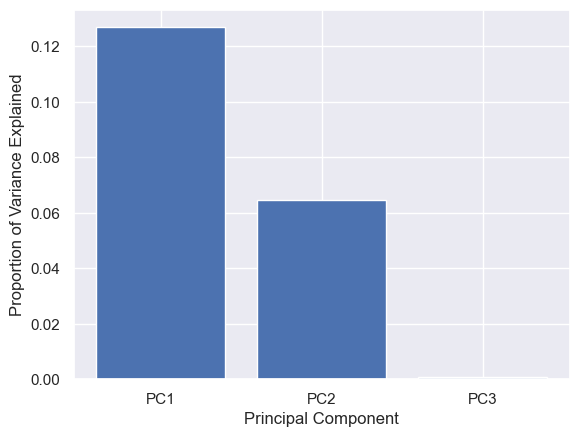

In [439]:
# EXPLAINED VARIANCE
var = pca.explained_variance_
print(var)
labels = ['PC1','PC2', 'PC3']
plt.figure()
plt.bar(labels, var, )
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')

In [440]:
df1 = pd.DataFrame(data = X_train_pc, columns = ['PC1', 'PC2', 'PC3'])
df2 = pd.concat([df1,y_train], axis = 1)
df2

,PC1,PC2,PC3,Action
0,0.002003,-0.182326,-0.001149,allow
1,-0.654276,0.571714,-0.008684,deny
2,0.116027,-0.112023,0.005945,allow
3,0.148517,-0.100844,-0.003641,allow
4,-0.467774,0.236452,-0.005715,deny
...,...,...,...,...
52420,0.502162,0.257860,0.106656,allow
52421,-0.181756,-0.277703,-0.001161,drop
52422,0.451526,0.616105,-0.018703,allow
52423,-0.444705,0.194982,-0.005347,deny


In [441]:
# PLOT COMPONENTS
total_var = pca.explained_variance_ratio_.sum() * 100
fig1 = px.scatter_3d(
    X_train_pc, x=0, y=1, z=2, color=df2['Action'], opacity=0.25, 
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'}
)
fig1.update_layout(legend=dict(
    yanchor="top",
    y=0.89,
    xanchor="left",
    x=0.7), title={
        'text': f'Total Explained Variance: {total_var:.2f}%',
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})   
fig1.show()

In [442]:
print('Number of features seen during fit: ', pca.n_features_in_)
print('Estimated noise covariance: ', pca.noise_variance_) 

Number of features seen during fit:  4
Estimated noise covariance:  5.545659426053895e-05


In [443]:
# PCA LOADINGS
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2', 'PC3'], index=targets)
loadings

,PC1,PC2,PC3
allow,-0.486117,0.873859,-0.007740
deny,0.873845,0.485977,-0.014868
drop,0.009222,0.014000,0.998988
reset-both,0.000406,0.000056,0.041727


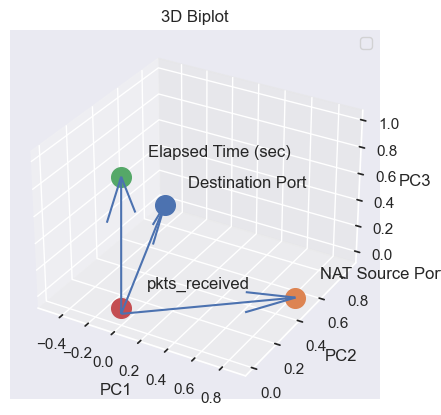

In [444]:
# BIPLOT
pca_df_scaled = df2.copy()
 
scaler_df = df2[['PC1', 'PC2', 'PC3']]
scaler = 1 / (scaler_df.max() - scaler_df.min())

for index in scaler.index:
    pca_df_scaled[index] *= scaler[index]
    
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot 3D scatterplot of PCA
#ax.scatter3D( xdata, ydata,  zdata, c=zdata, cmap='Greys', alpha=0.05)


#targets = ['allow', 'action', 'drop', 'reset-both']
#colors = ['b', 'r', 'g', 'purple']
#for target, color in zip(targets,colors):
#    indicesToKeep = pca_df_scaled['Action'] == target
 #   ax.scatter3D(pca_df_scaled.loc[indicesToKeep, 'PC1']
  #             , pca_df_scaled.loc[indicesToKeep, 'PC2'], 
 #               pca_df_scaled.loc[indicesToKeep, 'PC3']
   #            , c = color
   #            , s = 10, alpha = 0.2)
ax.legend(targets)

# Plot the loadings
for i, varnames in enumerate(features):
    ax.scatter(xs[i], ys[i], zs[i], s=200)
    ax.text(
        xs[i] + 0.1, 
       ys[i] + 0.1, 
        zs[i] + 0.1, 
       varnames)

# Define scaled features as arrays
xdata = pca_df_scaled['PC1']
ydata = pca_df_scaled['PC2']
zdata = pca_df_scaled['PC3']
 
# Define the x, y, z variables
loadings = pca.components_
xs = loadings[0]
ys = loadings[1]
zs = loadings[2]
 

# Plot arrows
x_arr = np.zeros(len(loadings[0]))
y_arr = z_arr = x_arr
ax.quiver(x_arr, y_arr, z_arr, xs, ys, zs)


 
# Plot title of graph
plt.title(f'3D Biplot')
 
# Plot x, y, z labels
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
 
plt.show()

#### Prediction

Random Forest Classification Prediction: 

In [445]:
# PREDICTION: RF
y_train.reset_index(drop=True, inplace=True)
classifier = RandomForestClassifier(max_depth=3, random_state=0)
classifier.fit(X_train_pc, np.squeeze(y_train))
y_pred = classifier.predict(X_test_pc) #predict 

In [446]:
# EVALUATE PERFORMANCE 
cm = confusion_matrix(y_test, y_pred)
print(cm)
acc31 = accuracy_score(y_test, y_pred)
print('Accuracy: ', acc31)

[[7335  187    0    0]
 [   4 2979    6    0]
 [   0    0 2589    0]
 [   1    6    0    0]]
Accuracy:  0.9844357976653697


In [447]:
# F1-SCORE 
f3a =  f1_score(y_test, y_pred,average='micro') 
f3b = f1_score(y_test, y_pred,average='macro')
f3c = f1_score(y_test, y_pred,average='weighted')
print('F1-score: ',f2a)
print('F1-score: ', f3b)
print('F1-score: ', f3c)

F1-score:  0.976577401388571
F1-score:  0.738243635645459
F1-score:  0.9843093543940842


In [448]:
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

       allow       1.00      0.98      0.99      7522
        deny       0.94      1.00      0.97      2989
        drop       1.00      1.00      1.00      2589
  reset-both       0.00      0.00      0.00         7

    accuracy                           0.98     13107
   macro avg       0.73      0.74      0.74     13107
weighted avg       0.98      0.98      0.98     13107



Logistic Regression Prediction: 

In [449]:
# PREDICTION: LR
classifier = LogisticRegression(random_state = 0,max_iter=1000)
classifier.fit(X_train_pc, y_train.values.ravel())
y_pred = classifier.predict(X_test_pc) #predict 

In [450]:
# EVALUATE PERFORMANCE 
cm = confusion_matrix(y_test, y_pred)
print(cm)
acc32 = accuracy_score(y_test, y_pred)
print('Accuracy: ', acc32)

[[7212   89  221    0]
 [   4 2772  213    0]
 [   0    0 2589    0]
 [   1    6    0    0]]
Accuracy:  0.9592584115358206


In [451]:
# F1-SCORES
f3d =  f1_score(y_test, y_pred,average='micro') 
f3e = f1_score(y_test, y_pred,average='macro')
f3f = f1_score(y_test, y_pred,average='weighted')
print('F1-score: ',f3d)
print('F1-score: ', f3e)
print('F1-score: ', f3f)

F1-score:  0.9592584115358206
F1-score:  0.7120037893125124
F1-score:  0.9597751071411912


In [452]:
print(classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

       allow       1.00      0.96      0.98      7522
        deny       0.97      0.93      0.95      2989
        drop       0.86      1.00      0.92      2589
  reset-both       0.00      0.00      0.00         7

    accuracy                           0.96     13107
   macro avg       0.71      0.72      0.71     13107
weighted avg       0.96      0.96      0.96     13107



### Accuracy-Score Comparison


In [453]:
scores_df = pd.DataFrame({'Number of components':['2', '2',  '3', '3'],
                          'Method': ['RF', 'LR', 'RF', 'LR'], 
                          'Accuracy': [acc21, acc22, acc31, acc32],  
                                    'f1_score (micro)': [f2a, f2d,  f3a,f3d],
                                    'f1_score (macro)':[f2b, f2e,  f3b,f3e],
                                    'f1_score (weighted)': [f2c, f2f,  f3c,f3f]})
scores_df

,Number of components,Method,Accuracy,f1_score (micro),f1_score (macro),f1_score (weighted)
0,2,RF,0.976577,0.976577,0.732443,0.976590
1,2,LR,0.958801,0.958801,0.711656,0.959324
2,3,RF,0.984436,0.984436,0.738244,0.984309
3,3,LR,0.959258,0.959258,0.712004,0.959775
